### Showing landmarks
We will now use the previous work to show the result of the detector and predictor working together for our webcam and video file

We'll need to import the following libraries:  
* **OpenCV** for computer vision tasks
* **Dlib** for face detection
* **NumPy** for data manipulation

In [1]:
import cv2 as cv
import dlib
import numpy as np

### Utility functions

`boxes_to_ndarray` converts from dlib `full_object_detection` object to a NumPy array

In [2]:
def boxes_to_ndarray(boxes, length):
    coords = np.array([(boxes.part(i).x, boxes.part(i).y) for i in range(length)], dtype="int")
    return coords

`draw_landmarks` draws the face prediction obtained from the grayscale image and draw on the input image

In [3]:
def draw_landmarks(model_predictor, face_boxes, color_image, gray_image, RGB=(0, 0, 255)):
    #withLandmarks = originalImage.copy()
    for (i, box) in enumerate(face_boxes):
        landmark_array = boxes_to_ndarray(model_predictor(gray_image, box), 68)
        for (x, y) in landmark_array:
            cv.circle(color_image, (x, y), 2, RGB, -1)
    #return withLandmarks

`show_feed` will now take the detector and predictor as inputs, which will be used when calling the `draw_landmarks` function.

In [4]:
def show_feed(feed, title, detector, predictor, wait=1, rewind=False):
    retval, frame_color = feed.read()
    
    while retval:
        cv.namedWindow(title, cv.WINDOW_AUTOSIZE)
        cv.setWindowProperty(title, cv.WND_PROP_VISIBLE, 1)
        
        frame_gray = cv.cvtColor(frame_color, cv.COLOR_BGR2GRAY)
        bounding_box = detector(frame_gray, 1)
        color = (0, 0, 255)
        
        draw_landmarks(predictor, bounding_box, frame_color, frame_gray, color)
        
        cv.imshow(title, frame_color)
        
        key_input = cv.waitKey(wait)
        if key_input != -1:
            break;
        
        retval, frame_color = feed.read()
    
    try:
        if rewind: # Rewind VideoCapture object for video files
            feed.set(cv.CAP_PROP_POS_MSEC, 0.0)
        cv.destroyWindow(title)
    except:
        print("'" + title + "' not found")

### Feed processing
Let's create our detector and predictor

In [5]:
face_detector =  dlib.get_frontal_face_detector()
landmark_predictor = dlib.shape_predictor('models/shape_predictor_68_face_landmarks.dat')

Now we create our `VideoCapture` objects:

##### Webcam

In [ ]:
webcam_index = 0
webcam = cv.VideoCapture(webcam_index)

Let's show our webcam feed as the face landmarks are predicted and drawn

In [20]:
show_feed(webcam,
          "My Webcam",
          face_detector,
          landmark_predictor,
          wait=1,
          rewind=True)

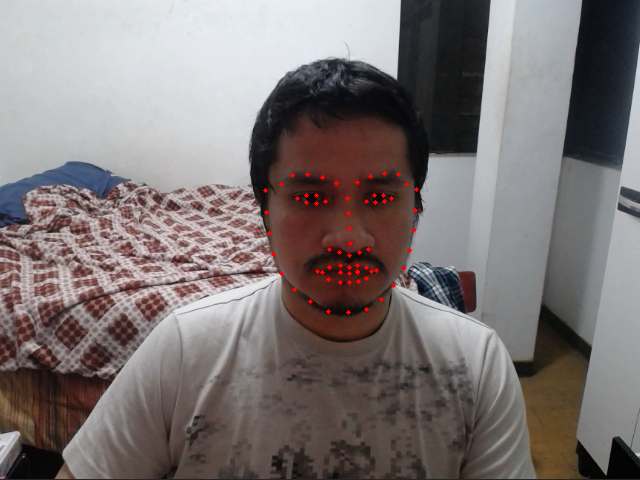

##### Video file

We need to setup some properties first

In [16]:
file = "videos/stock-video-480.mp4"
ffmpeg_api = cv.CAP_FFMPEG
video = cv.VideoCapture(file, ffmpeg_api)
fps = video_file.get(cv.CAP_PROP_FPS)
frame_wait = int(1000/fps) # Approximate for 30 frames per second
rewind = True

In [18]:
show_feed(video,
          "My video",
          face_detector,
          landmark_predictor,
          frame_wait,
          rewind)

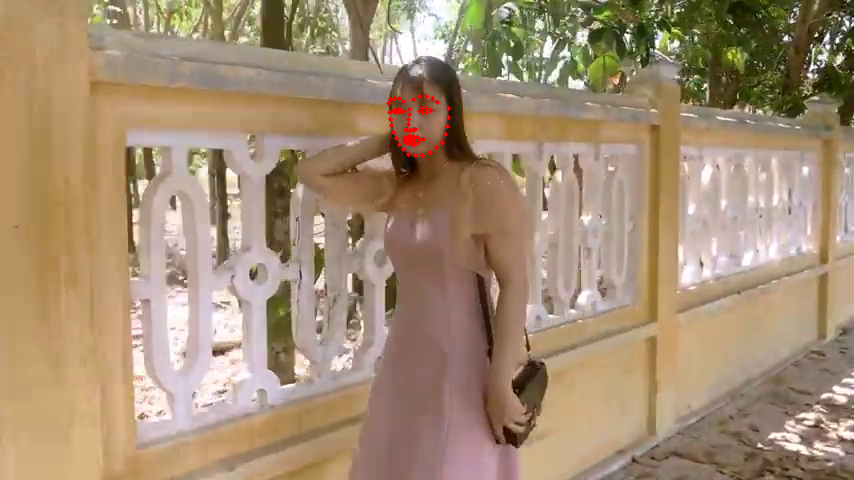
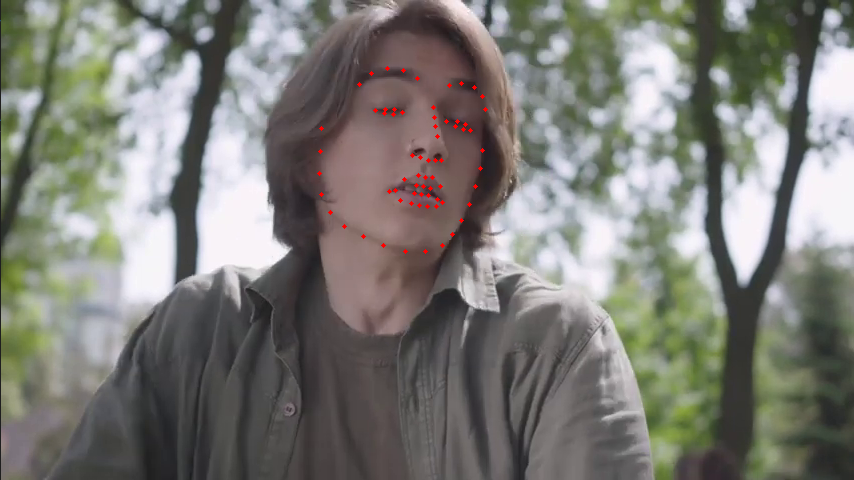

### Testing

Testing the angles at which the predictor stops detecting facial landmarks

##### Side to side

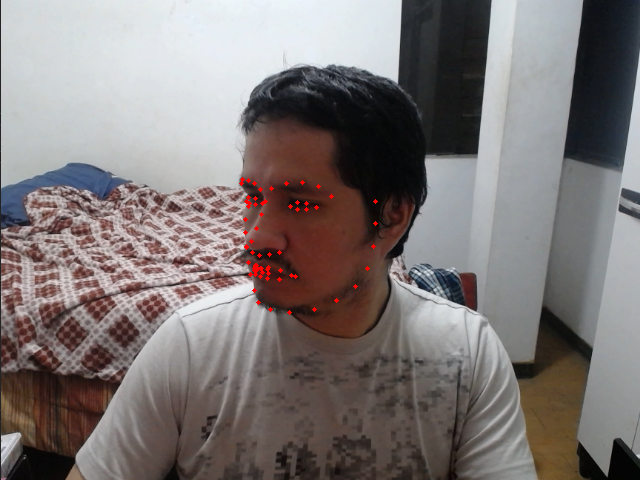
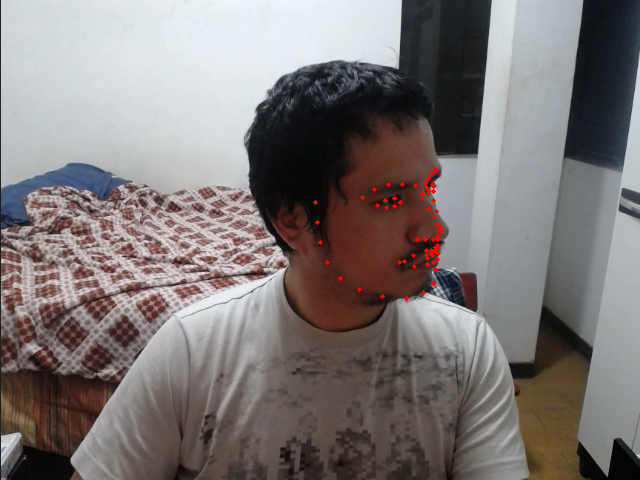

45 degrees to the right and 45 degrees to the left.

This means there is about a 90 degree field in front of the screen where the facial landmarks can be detected

##### Up and down

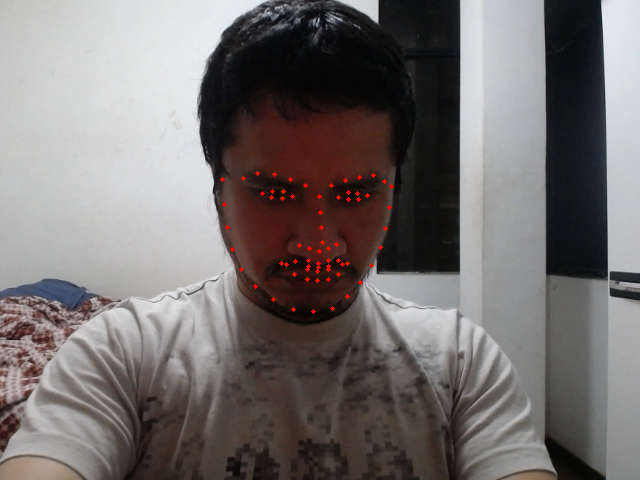
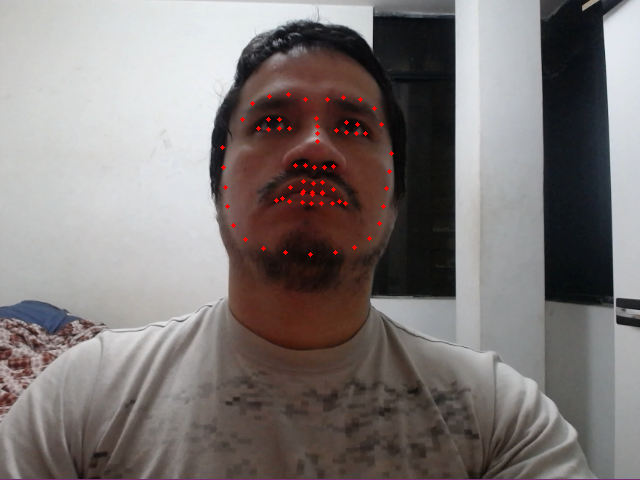

Perhaps unsurprisingly, the angles are similar: 45 degrees up and 45 degrees down.

Again, there is a 90 degree field up and down where the facial landmarks will be detected.

Acording to these tests, this field should be enough for regular computer screen use.

##### Blocking objects

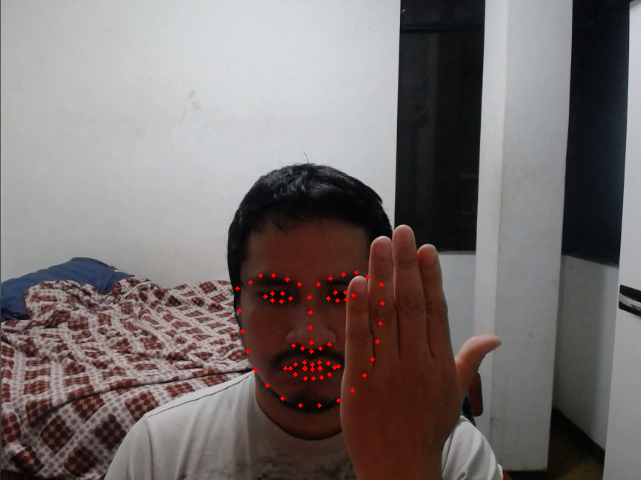
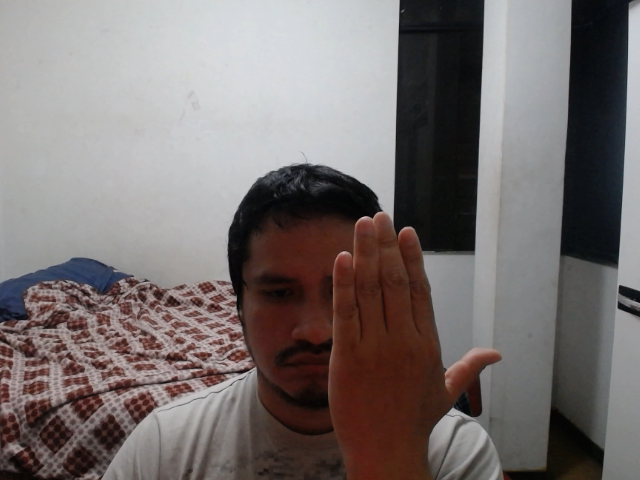

As we can see, about one third (1/3) of the face can be blocked before the facial landmarks stop being detected.

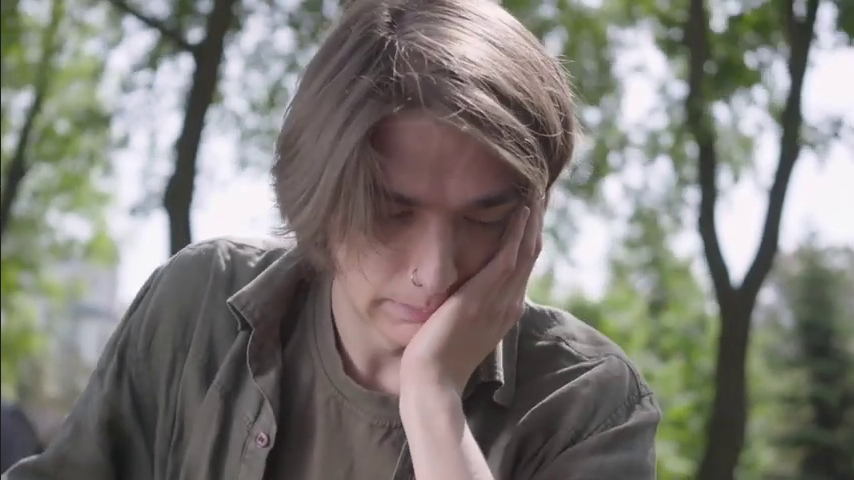

Hands on the face or hair blocking the face also affected the predictor's results.

##### Eyeware

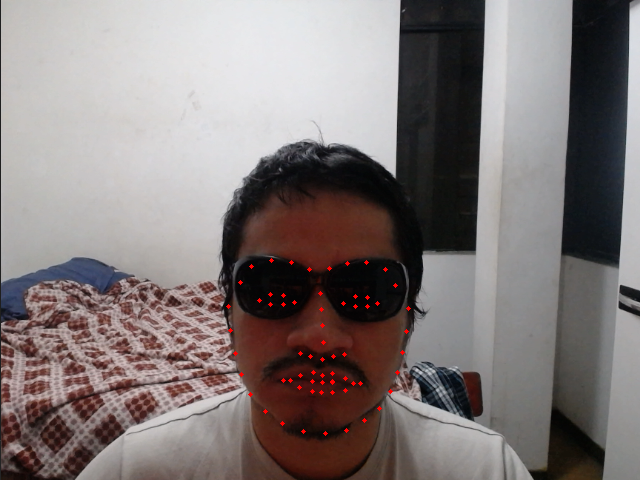

Only full frontal frames without much movement worked with sunglasses.

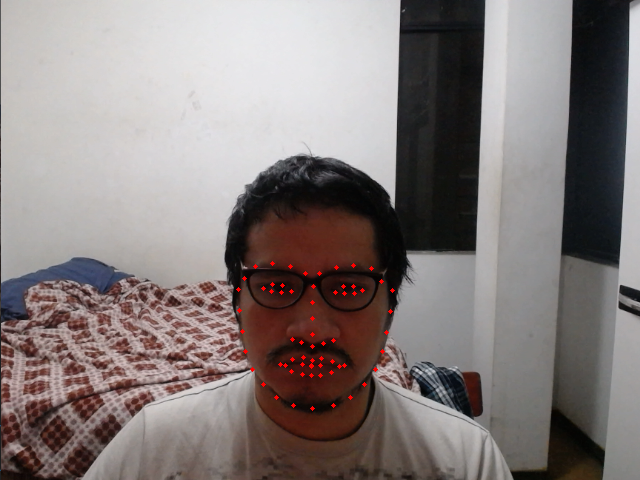
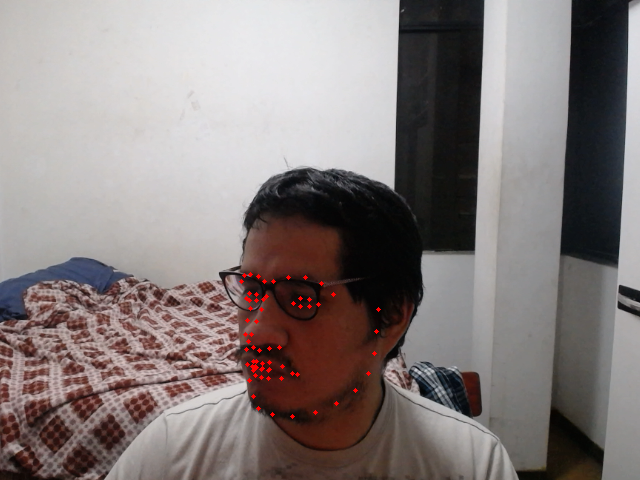
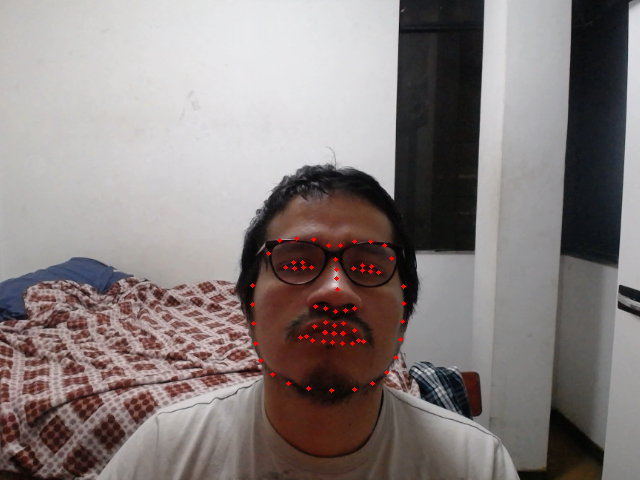

Clear eyeglasses, however, worked just fine and with a similar field of detection

##### False detection

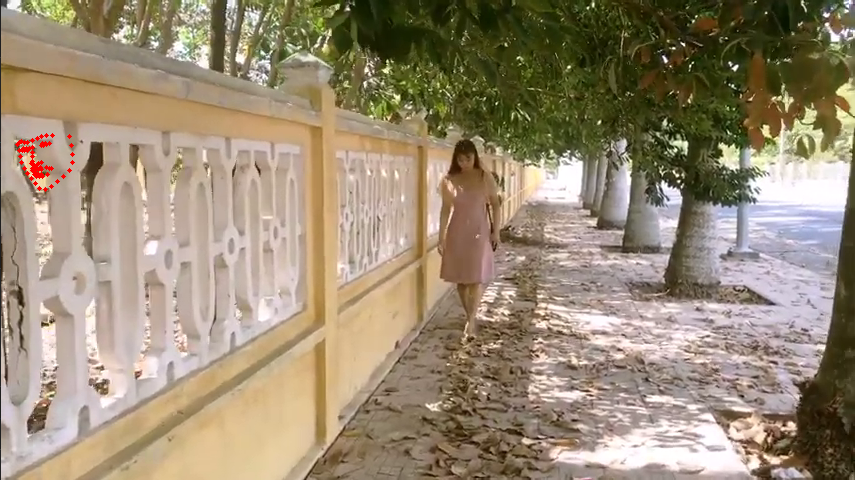

In some cases the predictor created false facial landmarks

##### Face size

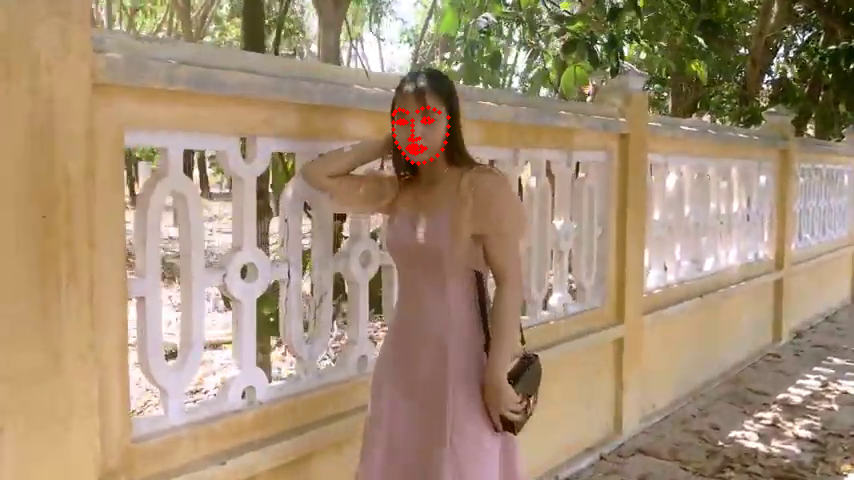

It was noticed that faces need to be a certain size in the frame in order for the facial landmarks to be detected

##### Profile view

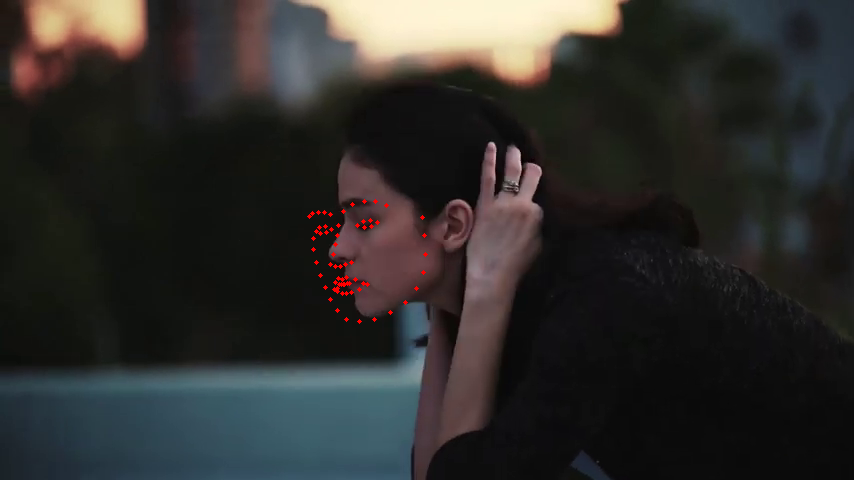

Since our face detector is made for full frontal images, it's not surprising that profile views are spotty and unreliable.
The use of a system and algorithm like that proposed by Le (2012) mayhelp in better detection of faces shot from the side as in a profile view

##### CPU usage

I noticed that when the CPU is being used at above 50%, the application struggled to show the predicted landmarks on a timely manner, making the webcam feed slow and not fluid.

This may interrupt the ability of the application to detect eye blinking, which is a huge issue and warrants the introduction of more techiniques that involve less use of resources.